In [18]:
import os 
import librosa
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt

In [19]:
# --- LOAD AUDIO FILES WITH LIBROSA ---
scale_file = "audio/scale.wav"
debussy_file = "audio/debussy.wav"
redhot_file = "audio/redhot.wav"
duke_file = "audio/duke.wav"

ipd.Audio(scale_file)

In [20]:
ipd.Audio(debussy_file)

In [21]:
ipd.Audio(redhot_file)

In [22]:
ipd.Audio(duke_file)

In [23]:
# --- LOAD AUDIO FILES WITH LIBROSA ---
scale, sr = librosa.load(scale_file)
debussy, _ = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _ = librosa.load(duke_file)

In [24]:
# --- EXTRACT STFT ---
FRAME_SIZE = 2048 # Typical parameters
HOP_SIZE = 512 

S_scale = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_scale.shape # X = frequency, Y = Number of frames (temporal bins)
type(S_scale[0][0])

numpy.complex64

In [26]:
# --- CALCULATE SPECTROGRAM ---
Y_scale = np.abs(S_scale) ** 2
Y_scale.shape
type(Y_scale[0][0])

numpy.float32

In [29]:
# --- VISUALIZE SPECTROGRAM ---
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y, sr=sr, hop_length=hop_length, x_axis="time", y_axis=y_axis)
    plt.colorbar(format="%+2.f")

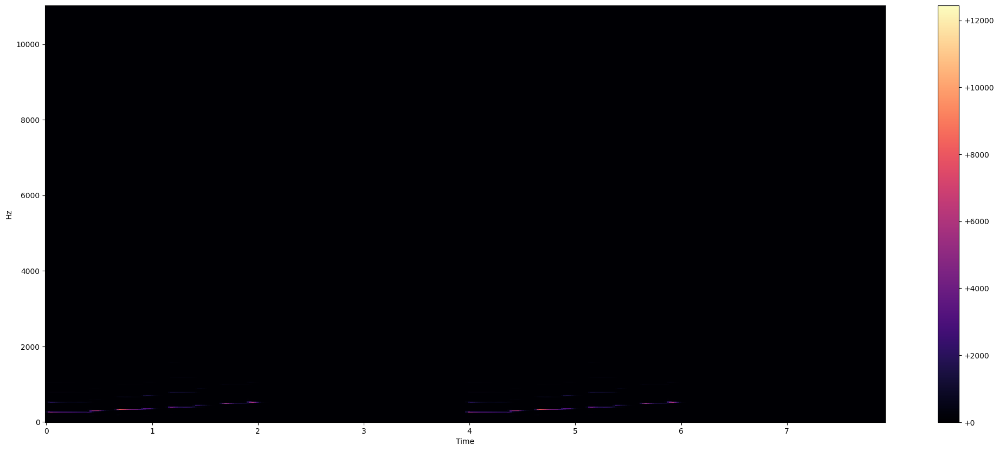

In [30]:
plot_spectrogram(Y_scale, sr, HOP_SIZE)

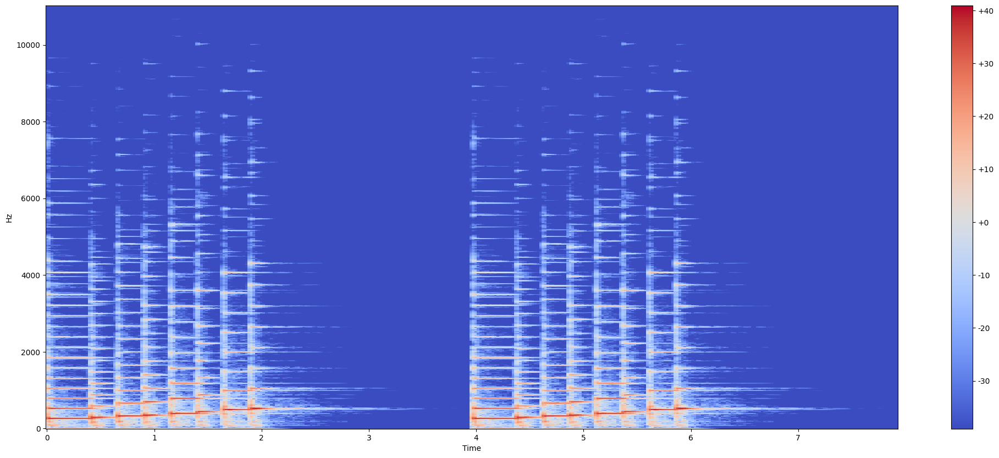

In [33]:
# --- LOG-AMPLITUDE SPECTROGRAM ---
Y_log_scale = librosa.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale, sr, HOP_SIZE)

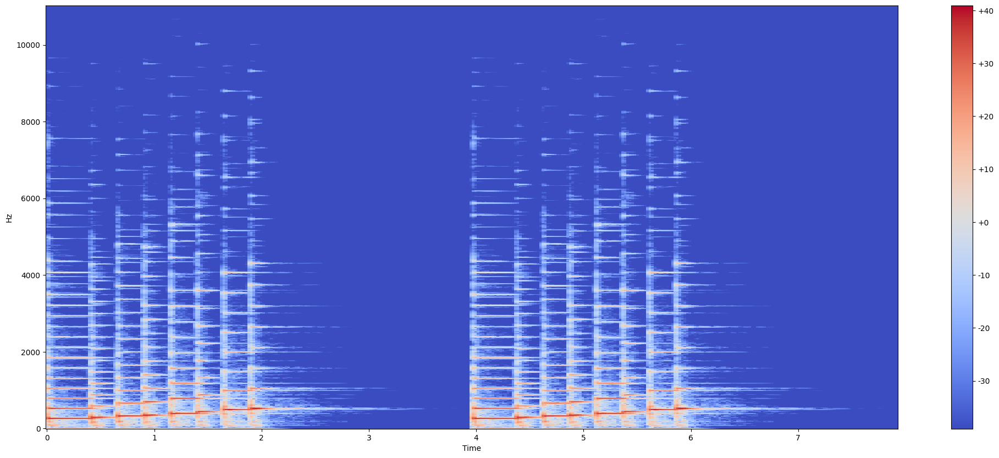

In [34]:
# --- LOG-FREQUENCY SPECTROGRAM ---
plot_spectrogram(Y_log_scale, sr, HOP_SIZE)

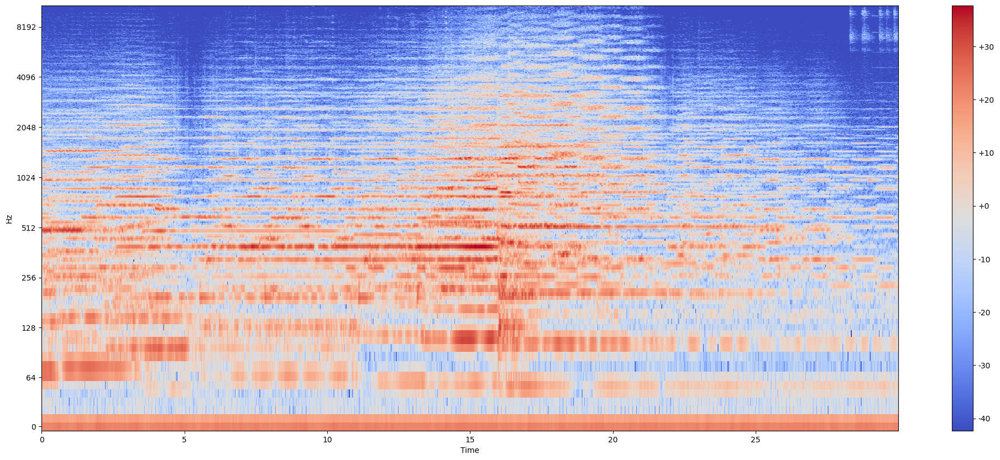

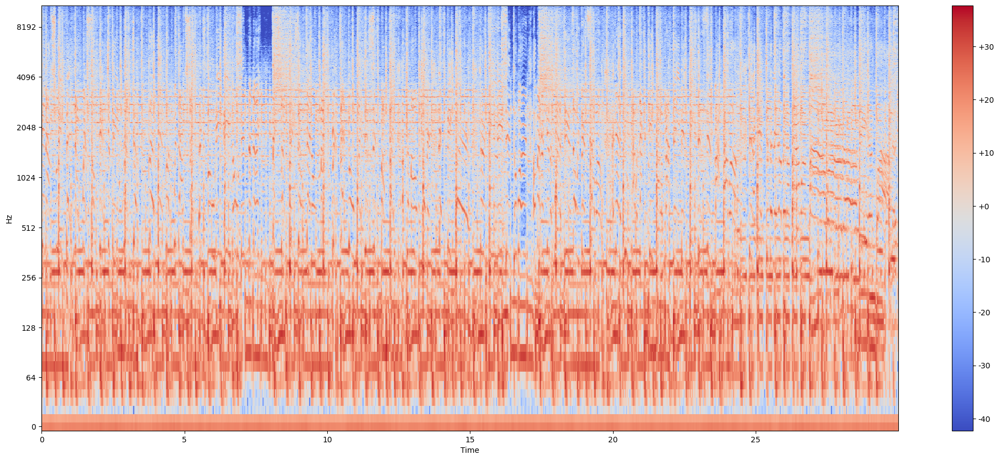

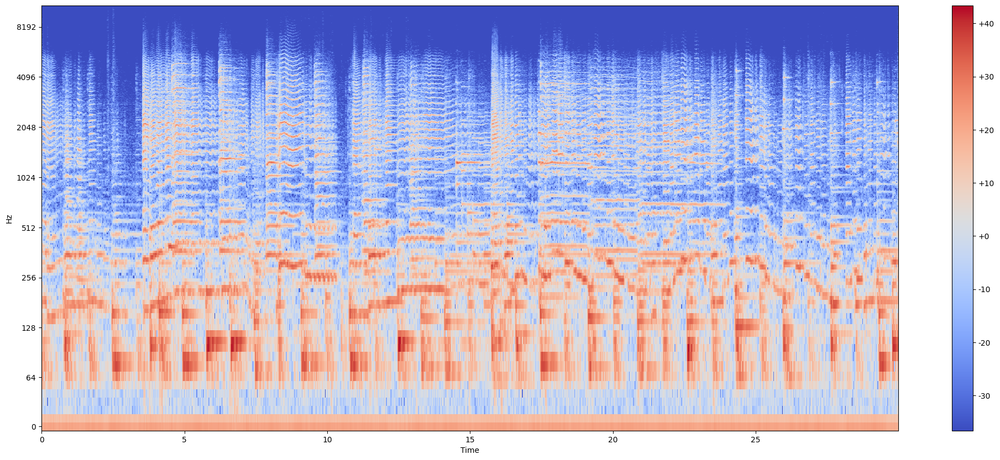

In [39]:
# --- VISUALIZE DIFFERENT GENRE SONGS --- 
S_debussy = librosa.stft(debussy, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_redhot = librosa.stft(redhot, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_duke = librosa.stft(duke, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

Y_debussy = librosa.power_to_db(np.abs(S_debussy) ** 2)
Y_redhot = librosa.power_to_db(np.abs(S_redhot) ** 2)
Y_duke = librosa.power_to_db(np.abs(S_duke) ** 2)

plot_spectrogram(Y_debussy, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_redhot, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_duke, sr, HOP_SIZE, y_axis="log")
